<a href="https://www.kaggle.com/code/gpreda/kaggle-masters-and-grandmasters-worldwide?scriptVersionId=150849022" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

## Kaggle Masters and Grandmasters Worldwide

The Kaggle tiers are currently: Competitions, Datasets, Notebooks and Discussion. 

For more details on the statistics of Kaggle tiers and rankings, see reference [1].  

Let's look to the geographical distribution of Kaggle Masters and Grandmasters on all categories and from entire World.  
Make sure to **click on the markers** on the map to see the details about each Kaggle Master or Grandmaster!!

We rerun periodically this Notebook, to capture the new entries in this exclusive club.

In [1]:
import pandas as pd
import datetime
from IPython.display import Markdown
from IPython.display import Image
import folium
import numpy as np
from folium.plugins import MarkerCluster
from folium import Marker
n_users = pd.read_csv("../input/meta-kaggle/Users.csv")
master_achievements_df = pd.read_csv("../input/meta-kagglemaster-achievements-snapshot/MasterAchievements.csv")
master_achievements_df['M_GM_tier_count'] = master_achievements_df[master_achievements_df.astype(str).isin(['master','grandmaster'])].count(axis=1)
sel_gm_df = master_achievements_df[master_achievements_df['M_GM_tier_count'] > 0]
master_profiles_df = pd.read_csv("../input/meta-kagglemaster-achievements-snapshot/MasterProfiles.csv")
gm_profiles_df = sel_gm_df.merge(master_profiles_df)
gm_df = gm_profiles_df.loc[(~gm_profiles_df.Latitude.isna()) & (~gm_profiles_df.Longitude.isna())]

In [2]:
def popup_html(row):

    user_name = row['UserName']
    user_avatar = row['Avatar']
    user_address = row['Location']
    user_country = row['Country']
    user_co = row['Competitions']
    user_da = row['Datasets']
    user_no = row['Notebooks']
    user_di = row['Discussion']
    highest_rank = row['HighestRank']
    metadata = row['Metadata']
    title_type = row['M_GM_tier_count']

    gm_img_address = "https://www.kaggle.com/static/images/tiers/grandmaster@48.png"
    
    # set a width to 0 to hide 4th image if it is triple grandmaster only

    left_col_color = "#4166AA"
    right_col_color = "#f2f0d3"

    
    html = """<!DOCTYPE html>
    <html>
    <head>

    <center><img src=\"""" + user_avatar + """\" alt="logo" width=100 height=100 ></center>
    <h4 style="margin-bottom:10"; width="200px">{}</h4>""".format(user_name) + """

    <h6 style="margin-bottom:10"; width="200px">{}</h4>""".format("") + """  

    </head>
        <table style="height: 126px; width: 350px;">
    <tbody>

    <tr>
    <td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Highest Rank</span></td>
    <td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(highest_rank) + """
    </tr>

    <tr>
    <td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Competitions Tier</span></td>
    <td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(user_co) + """
    </tr>
    <tr>
    <td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Datasets Tier</span></td>
    <td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(user_da) + """
    </tr>
    <tr>
    <td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Notebooks Tier</span></td>
    <td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(user_no) + """
    </tr>

    <tr>
    <td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Discussions Tier</span></td>
    <td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(user_di) + """
    </tr>

    <tr>
    <td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Metadata</span></td>
    <td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(metadata) + """
    </tr>

    <tr>
    <td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Address</span></td>
    <td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(user_address) + """
    </tr>

    <tr>
    <td style="background-color: """+ left_col_color +""";"><span style="color: #ffffff;">Country</span></td>
    <td style="width: 150px;background-color: """+ right_col_color +""";">{}</td>""".format(user_country) + """
    </tr>

    </tbody>
    </table>
    </html>
    """
    return html

In [3]:
gm_map = folium.Map(location=[0, 0], zoom_start=2)
width = 200
height = 500
gm_popups, gm_locations = [], []

for idx, row in gm_df.iterrows():

    gm_locations.append([row['Latitude'], row['Longitude']])
    html = popup_html(row)
    popup = folium.Popup(folium.Html(html, script=True), max_width=500)
    gm_popups.append(popup)      
    
gm = folium.FeatureGroup(name='Masters Grandmasters')
gm.add_child(MarkerCluster(locations=gm_locations, popups=gm_popups))
gm_map.add_child(gm)

# Country distribution of Masters and Grandmasters

In [4]:
!pip install country-converter

     |████████████████████████████████| 45 kB 1.4 MB/s 


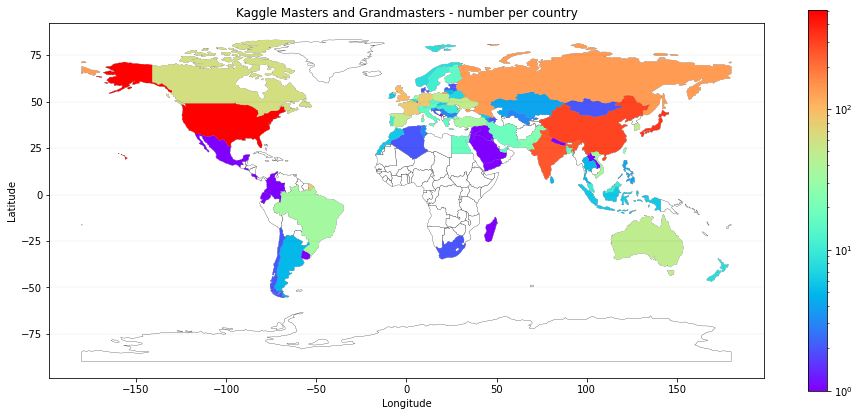

In [5]:
import geopandas as gpd
import matplotlib
import country_converter as cc
import matplotlib.pyplot as plt
gm_agg_df = gm_df.groupby(["Country"])["M_GM_tier_count"].count().reset_index()
gm_agg_df.columns = ["Country", "Count"]
# convert ISO2 to ISO3 country codes - to be used with geopandas plot of countries
gm_agg_df["iso_a3"] = gm_agg_df["Country"].apply(lambda x: cc.convert(x, to='ISO3'))
world = gpd.read_file(gpd.datasets.get_path('naturalearth_lowres'))
world.loc[world.name=="France", "iso_a3"] = "FRA"
world.loc[world.name=="Norway", "iso_a3"] = "NOR"
world.loc[world.name=="Kosovo", "iso_a3"] = "KOS"
world_gm = world.merge(gm_agg_df, on="iso_a3", how="right")

f, ax = plt.subplots(1, 1, figsize=(16, 7))
# show all countries contour with black and color while
world.plot(column=None, color="white", edgecolor='black', linewidth=0.25, ax=ax) 
# draw countries polygons with log scale colormap
world_gm.plot(column='Count', legend=True,\
           norm=matplotlib.colors.LogNorm(vmin=world_gm.Count.min(),\
                                          vmax=world_gm.Count.max()), 
           cmap="rainbow",
           ax=ax)
plt.grid(color="black", linestyle=":", linewidth=0.1, axis="y", which="major")
plt.xlabel("Longitude"); plt.ylabel("Latitude")
plt.title("Kaggle Masters and Grandmasters - number per country")
plt.show()

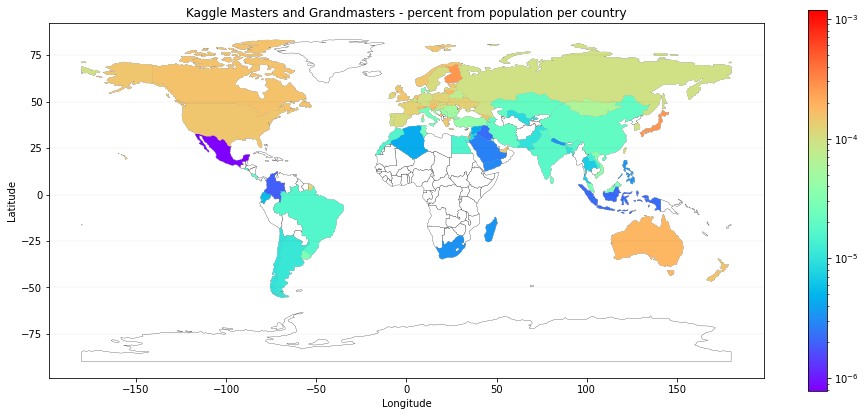

In [6]:
world_pop = pd.read_csv("/kaggle/input/world-population-dataset/world_population.csv")
world_pop["iso_a3"] = world_pop["CCA3"]
world_pop["pop_2022"] = world_pop["2022 Population"]
world_pop_gm = world_gm.merge(world_pop[["iso_a3", "pop_2022"]])
world_pop_gm = world_pop_gm.loc[~world_pop_gm.pop_2022.isna()]
world_pop_gm = world_pop_gm.loc[world_pop_gm.pop_2022 > 0]
world_pop_gm["Ratio"] = world_pop_gm["Count"] / world_pop_gm["pop_2022"] * 100
f, ax = plt.subplots(1, 1, figsize=(16, 7))
# show all countries contour with black and color while
world.plot(column=None, color="white", edgecolor='black', linewidth=0.25, ax=ax) 
# draw countries polygons with log scale colormap
world_pop_gm.plot(column='Ratio', legend=True,\
           norm=matplotlib.colors.LogNorm(vmin=world_pop_gm.Ratio.min(),\
                                          vmax=world_pop_gm.Ratio.max()), 
           cmap="rainbow",
           ax=ax)
plt.grid(color="black", linestyle=":", linewidth=0.1, axis="y", which="major")
plt.xlabel("Longitude"); plt.ylabel("Latitude")
plt.title("Kaggle Masters and Grandmasters - percent from population per country")
plt.show()

In [7]:
import plotly.express as px
world_pop_gm_red = world_pop_gm[["continent", "iso_a3", "Country", "Count", "pop_2022", "Ratio"]]
world_pop_gm_red.loc[world_pop_gm_red.Country=="Isle of Man", "continent"] = "Europe"
world_pop_gm_red.loc[world_pop_gm_red.Country=="Malta", "continent"] = "Europe"
world_pop_gm_red.loc[world_pop_gm_red.Country=="Singapore", "continent"] = "Asia"
fig = px.scatter(world_pop_gm_red, x='pop_2022', y='Ratio', size="Count", color="continent")
fig.show() 

/opt/conda/lib/python3.7/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


## References  

[1] Carl McBride Ellis, Kaggle in Numbers, https://www.kaggle.com/code/carlmcbrideellis/kaggle-in-numbers  
[2] Use HTML in Folium Maps: A Comprehensive Guide for Data Scientists, My Data Talk, Towards Data Science, https://towardsdatascience.com/use-html-in-folium-maps-a-comprehensive-guide-for-data-scientists-3af10baf9190  